In [1]:
# IMPORTS

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import random

from textblob import TextBlob

import re
import string
from tqdm import tqdm

# NLTK
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk
from nltk.stem.porter import PorterStemmer

# GENSIM
from gensim.corpora import Dictionary
from gensim.models.ldamodel import LdaModel
from gensim.models.coherencemodel import CoherenceModel
from gensim.utils import simple_preprocess
from gensim.corpora import MmCorpus

# SKLEARN
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import CountVectorizer
from sklearn import metrics
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import silhouette_score


# SPACY
import spacy
from spacy.util import compounding
from spacy.util import minibatch
from spacy.training.example import Example

# VADER
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

from nltk.tokenize import RegexpTokenizer
from nltk.stem.snowball import SnowballStemmer

c:\Users\Tristan\anaconda3\lib\site-packages\torch\cuda\__init__.py:651: UserWarning: CUDA initialization: The NVIDIA driver on your system is too old (found version 10020). Please update your GPU driver by downloading and installing a new version from the URL: http://www.nvidia.com/Download/index.aspx Alternatively, go to: https://pytorch.org to install a PyTorch version that has been compiled with your version of the CUDA driver. (Triggered internally at C:\cb\pytorch_1000000000000\work\c10\cuda\CUDAFunctions.cpp:109.)
  return torch._C._cuda_getDeviceCount() if nvml_count < 0 else nvml_count


In [2]:
SENTIMENT_THRESHOLDS = (-0.8, 0.5)

In [125]:
df_1 = pd.read_csv('../data/dataset_twitter-scraper_2023-02-16_09-48-43-259.csv')
df_2 = pd.read_csv('../data/dataset_twitter-scraper_2023-03-17_16-08-18-409.csv')

C:\Users\Tristan\AppData\Local\Temp\ipykernel_7056\3138427222.py:1: DtypeWarning:

Columns (7,8,9,10,11,24,60,98,99,101,102,104,105,107,108,110,111,113,114,116,117,119,120,122,123,125,126,128,129,131,132,134,135,137,138,140,141,143,144,146,147,149,150,152,153,155,156,158,159,161,162,164,165,167,168,170,171,173,174,176,177,179,180,182,183,185,186,188,189,191,192,194,195,197,198,200,201,203,204,206,207,209,210) have mixed types. Specify dtype option on import or set low_memory=False.

C:\Users\Tristan\AppData\Local\Temp\ipykernel_7056\3138427222.py:2: DtypeWarning:

Columns (35,36,37,38) have mixed types. Specify dtype option on import or set low_memory=False.



In [126]:
df = pd.concat([df_1, df_2], ignore_index=True)

In [122]:
df.shape

(68056, 3)

In [20]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Tristan\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [127]:
custom_stopwords = {'"', "'", "rt", "’", "“", "”", "…", "‘", "amp"}
stemmer = PorterStemmer()

def clean_text(text):
    # Remove URLs
    text = re.sub(r'https\S+', '', text)
    text = re.sub(r'http\S+', '', text)
    # Remove mentions
    text = re.sub(r'@\w+', '', text)
    # Remove hashtags
    text = re.sub(r'#\w+', '', text)
    # Remove punctuation
    text = text.translate(str.maketrans('', '', string.punctuation))
    # Convert to lowercase 
    text = text.lower()
    # Remove stop words
    stop_words = set(stopwords.words('english')) | custom_stopwords

    tokens = simple_preprocess(text)

    filtered_text = [word for word in tokens if word not in stop_words]

    # stem the words in the tweet
    filtered_text = [stemmer.stem(token) for token in filtered_text]

    return filtered_text

In [124]:
df

,x,y,cluster
0,-6.621658,-30.683796,1
1,25.800793,9.415060,0
2,0.754524,-1.611065,0
3,29.997208,22.064390,0
4,16.877069,15.002822,0
...,...,...,...
68051,-0.131164,-25.550169,1
68052,17.928928,40.400795,0
68053,13.917093,25.755686,0
68054,13.688834,25.919268,0


In [128]:
# Cleaning the text data
df['clean_text'] = df['full_text'].apply(clean_text)

C:\Users\Tristan\AppData\Local\Temp\ipykernel_7056\737075904.py:2: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



In [111]:
analyzer = SentimentIntensityAnalyzer()
get_sentiment = lambda tweet: analyzer.polarity_scores(" ".join(tweet))['compound']

In [112]:
# getting the sentiment score for each Tweet
df['sentiment_score'] = df['clean_text'].apply(get_sentiment)

KeyError: 'clean_text'

In [130]:
df = df[df['full_clean_text'] != '']

In [131]:
df['full_clean_text'].eq('').sum()

0

In [72]:
df.head()

,conversation_id,created_at,favorite_count,full_text,hashtags/0,hashtags/1,hashtags/2,hashtags/3,hashtags/4,hashtags/5,...,user_mentions/49/screen_name,view_count,hashtags/8,hashtags/9,hashtags/10,hashtags/11,hashtags/12,clean_text,sentiment_score,full_clean_text
0,1.625495e+18,2023-02-14T14:01:18.000Z,410055.0,"Happy Valentine’s Day to the one and only, @Mi...",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,16532336.0,NaN,NaN,NaN,NaN,NaN,"[happi, valentin, day, one, make, everi, day, ...",0.3612,happi valentin day one make everi day feel lik...
1,1.625144e+18,2023-02-13T14:43:21.000Z,28215.0,"Congratulations to the Kansas City @Chiefs, Pa...",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,2775676.0,NaN,NaN,NaN,NaN,NaN,"[congratul, kansa, citi, patrick, mahom, travi...",0.9360,congratul kansa citi patrick mahom travi kelc ...
2,1.623490e+18,2023-02-09T01:12:15.000Z,9131.0,@KingJames has been changing the game for 20 y...,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,492644.0,NaN,NaN,NaN,NaN,NaN,"[chang, game, year, becom, leader, court, cong...",0.0000,chang game year becom leader court congrat mak...
4,1.622771e+18,2023-02-07T01:35:28.000Z,13821.0,The scale of devastation after the earthquakes...,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,3117489.0,NaN,NaN,NaN,NaN,NaN,"[scale, devast, earthquak, türkiy, syria, almo...",0.4019,scale devast earthquak türkiy syria almost uni...
5,1.625726e+18,2023-02-16T06:14:04.000Z,1319.0,@BillyM2k @cb_doge Well I would hope that most...,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,83061.0,NaN,NaN,NaN,NaN,NaN,"[well, would, hope, san, franciscan, agre, pri...",0.6124,well would hope san franciscan agre principl


### KMeans clustering

In [114]:
get_full_clean_text = lambda tweet: " ".join(tweet)

In [134]:
df['full_clean_text'] = df['clean_text'].apply(get_full_clean_text)
df = df[df['full_clean_text'].apply(lambda x: len(x) >= 20)]


In [135]:
df

,conversation_id,created_at,favorite_count,full_text,hashtags/0,hashtags/1,hashtags/2,hashtags/3,hashtags/4,hashtags/5,...,user_mentions/49/name,user_mentions/49/screen_name,view_count,hashtags/8,hashtags/9,hashtags/10,hashtags/11,hashtags/12,clean_text,full_clean_text
0,1.625495e+18,2023-02-14T14:01:18.000Z,410055.0,"Happy Valentine’s Day to the one and only, @Mi...",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,16532336.0,NaN,NaN,NaN,NaN,NaN,"[happi, valentin, day, one, make, everi, day, ...",happi valentin day one make everi day feel lik...
1,1.625144e+18,2023-02-13T14:43:21.000Z,28215.0,"Congratulations to the Kansas City @Chiefs, Pa...",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,2775676.0,NaN,NaN,NaN,NaN,NaN,"[congratul, kansa, citi, patrick, mahom, travi...",congratul kansa citi patrick mahom travi kelc ...
2,1.623490e+18,2023-02-09T01:12:15.000Z,9131.0,@KingJames has been changing the game for 20 y...,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,492644.0,NaN,NaN,NaN,NaN,NaN,"[chang, game, year, becom, leader, court, cong...",chang game year becom leader court congrat mak...
4,1.622771e+18,2023-02-07T01:35:28.000Z,13821.0,The scale of devastation after the earthquakes...,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,3117489.0,NaN,NaN,NaN,NaN,NaN,"[scale, devast, earthquak, türkiy, syria, almo...",scale devast earthquak türkiy syria almost uni...
5,1.625726e+18,2023-02-16T06:14:04.000Z,1319.0,@BillyM2k @cb_doge Well I would hope that most...,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,83061.0,NaN,NaN,NaN,NaN,NaN,"[well, would, hope, san, franciscan, agre, pri...",well would hope san franciscan agre principl
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71437,NaN,2020-09-25T18:31:32.000Z,NaN,"Just landed in Atlanta, Georgia. On my way now...",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"[land, atlanta, georgia, way, see, everyon, sh...",land atlanta georgia way see everyon shortli
71438,NaN,2020-09-25T17:03:53.000Z,NaN,Just had a great #LatinosForTrump Roundtable i...,LatinosForTrump,MAGA,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"[great, roundtabl, doral, florida, achiev, les...",great roundtabl doral florida achiev less mont...
71439,NaN,2020-09-25T14:13:01.000Z,NaN,RT @jsolomonReports: Breaking: Flynn case bomb...,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"[break, flynn, case, bombshel, fbi, analyst, b...",break flynn case bombshel fbi analyst bought i...
71440,NaN,2020-09-25T14:12:24.000Z,NaN,"RT @McAdooGordon: Wow &amp; I mean, wow. Jaw d...",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"[wow, mean, wow, jaw, dropper, cia, analyst, b...",wow mean wow jaw dropper cia analyst buy profe...


### Vectorizing

#### Using Tf-IDF

In [57]:
vectorizer = TfidfVectorizer()
X_tfidf = vectorizer.fit_transform(df['full_clean_text'])

#### Using BERT

In [75]:
from transformers import AutoTokenizer, AutoModel
import torch

In [136]:

model_name = "distilbert-base-uncased"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModel.from_pretrained(model_name)

def get_bert_embedding(text):
    inputs = tokenizer(text, return_tensors="pt", padding=True, truncation=True)
    with torch.no_grad():
        outputs = model(**inputs)
    return outputs.last_hidden_state.mean(dim=1)

X_bert = torch.cat([get_bert_embedding(tweet) for tweet in df['full_clean_text']], dim=0)

Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertModel: ['vocab_layer_norm.bias', 'vocab_projector.bias', 'vocab_transform.bias', 'vocab_transform.weight', 'vocab_projector.weight', 'vocab_layer_norm.weight']
- This IS expected if you are initializing DistilBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [81]:
X_bert

tensor([[-0.2002, -0.0826,  0.4214,  ..., -0.0719,  0.0644,  0.0440],
        [-0.0727,  0.0294,  0.1343,  ...,  0.1246, -0.0672,  0.0264],
        [-0.1212, -0.0276,  0.3295,  ...,  0.0884,  0.1747,  0.1041],
        ...,
        [ 0.1632, -0.2129,  0.1546,  ...,  0.0144,  0.0881, -0.0793],
        [ 0.1732,  0.0535,  0.1589,  ...,  0.0034,  0.1389, -0.1003],
        [ 0.0629, -0.2093,  0.0576,  ...,  0.0116, -0.1077,  0.2429]])

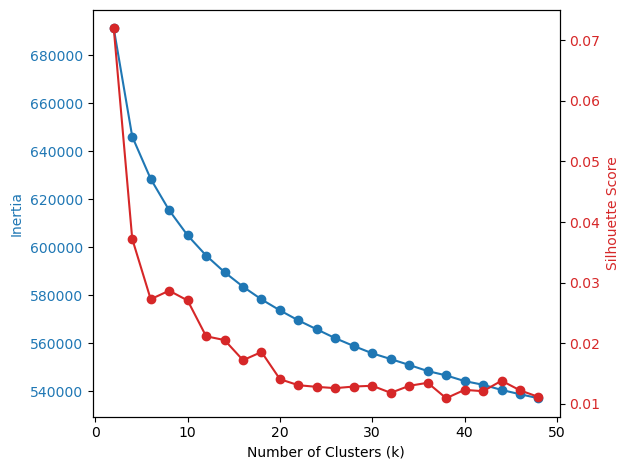

In [138]:
# Precompute the range of k values you want to test
k_values =  list(range(2, 50, 2))
# For the Elbow method, store the inertia (sum of squared distances) for each k
inertias = []

# For the Silhouette score, store the score for each k
silhouette_scores = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=75)
    kmeans.fit(X_bert)
    
    # Append the inertia to the list
    inertias.append(kmeans.inertia_)
    
    # Calculate the Silhouette score
    silhouette = silhouette_score(X_bert, kmeans.labels_)
    silhouette_scores.append(silhouette)

# Plot the Elbow method and Silhouette scores
import matplotlib.pyplot as plt

fig, ax1 = plt.subplots()

ax1.set_xlabel('Number of Clusters (k)')
ax1.set_ylabel('Inertia', color='tab:blue')
ax1.plot(k_values, inertias, marker='o', color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')

ax2 = ax1.twinx()
ax2.set_ylabel('Silhouette Score', color='tab:red')
ax2.plot(k_values, silhouette_scores, marker='o', color='tab:red')
ax2.tick_params(axis='y', labelcolor='tab:red')

fig.tight_layout()
plt.show()


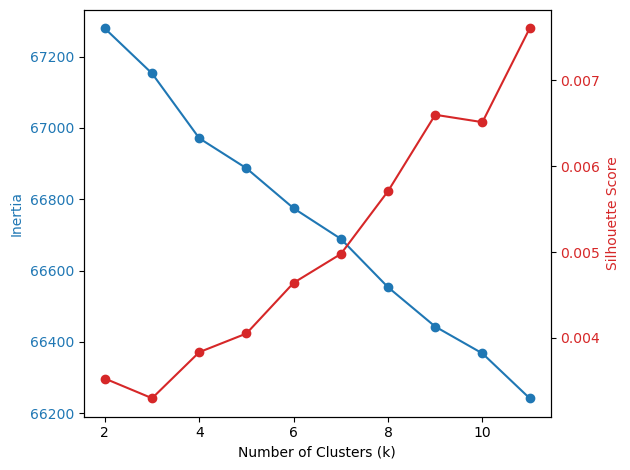

In [58]:
# Precompute the range of k values you want to test
k_values = list(range(2, 12))  # Example: testing k from 2 to 10

# For the Elbow method, store the inertia (sum of squared distances) for each k
inertias = []

# For the Silhouette score, store the score for each k
silhouette_scores = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_tfidf)
    
    # Append the inertia to the list
    inertias.append(kmeans.inertia_)
    
    # Calculate the Silhouette score
    silhouette = silhouette_score(X_tfidf, kmeans.labels_)
    silhouette_scores.append(silhouette)

# Plot the Elbow method and Silhouette scores
import matplotlib.pyplot as plt

fig, ax1 = plt.subplots()

ax1.set_xlabel('Number of Clusters (k)')
ax1.set_ylabel('Inertia', color='tab:blue')
ax1.plot(k_values, inertias, marker='o', color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')

ax2 = ax1.twinx()
ax2.set_ylabel('Silhouette Score', color='tab:red')
ax2.plot(k_values, silhouette_scores, marker='o', color='tab:red')
ax2.tick_params(axis='y', labelcolor='tab:red')

fig.tight_layout()
plt.show()

In [139]:
k = 18
kmeans = KMeans(n_clusters=k, random_state=42)
kmeans.fit(X_bert)
cluster_labels = kmeans.labels_

In [59]:
k_tfidf = 8
kmeans_tfidf = KMeans(n_clusters=k_tfidf, random_state=42)
kmeans_tfidf.fit(X_tfidf)
cluster_labels_tfidf = kmeans_tfidf.labels_

### Saving the model


In [154]:
import pickle

with open('kmeans_model.pkl', 'wb') as f:
    pickle.dump(kmeans, f)

In [151]:
cluster_counts = np.bincount(cluster_labels)
print(cluster_counts)

[3387 2471 1954 1691 2876 3850 2155 4763 4588 1814 2371 4799 1310 2772
 2393 3276 3962 2832]


In [140]:
clustered_tweets = {i: [] for i in range(k)}

# Filter out data points with no assigned cluster
X_clustered = X_bert[cluster_labels != -1]
cluster_labels_filtered = cluster_labels[cluster_labels != -1]

for i, label in enumerate(cluster_labels_filtered):
    clustered_tweets[label].append(df['full_clean_text'].iloc[i])


In [60]:
clustered_tweets_tfidf = {i: [] for i in range(k_tfidf)}    

# Filter out data points with no assigned cluster
X_clustered_tfidf = X_tfidf[cluster_labels_tfidf != -1]
cluster_labels_filtered_tfidf = cluster_labels_tfidf[cluster_labels_tfidf != -1]

for i, label in enumerate(cluster_labels_filtered_tfidf):
    clustered_tweets_tfidf[label].append(df['full_clean_text'].iloc[i])

In [41]:
from wordcloud import WordCloud

In [63]:
def generate_wordcloud(cluster_tweets, title):
    # Combine all tweets in the cluster into one text
    combined_text = ' '.join(cluster_tweets)
    
    # Create a WordCloud object
    wordcloud = WordCloud(background_color='white', max_words=100, contour_width=3, contour_color='steelblue', collocations=False)
    
    # Generate a word cloud
    wordcloud.generate(combined_text)
    
    # Visualize the word cloud
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(title)
    plt.axis('off')
    plt.show()

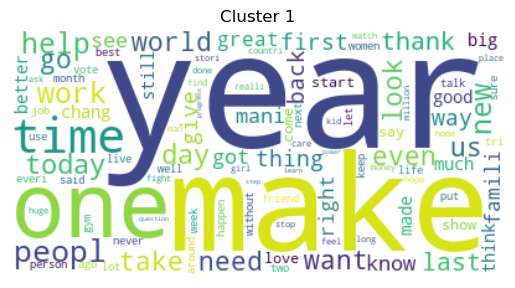

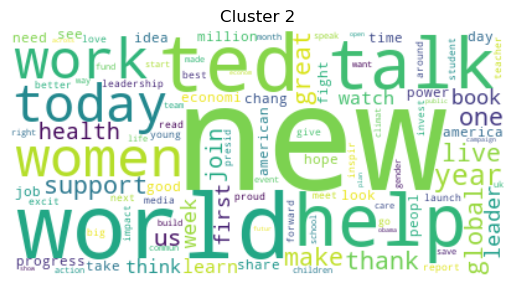

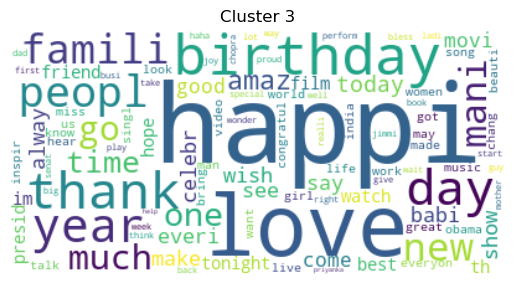

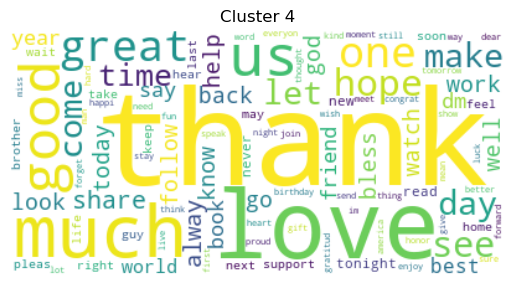

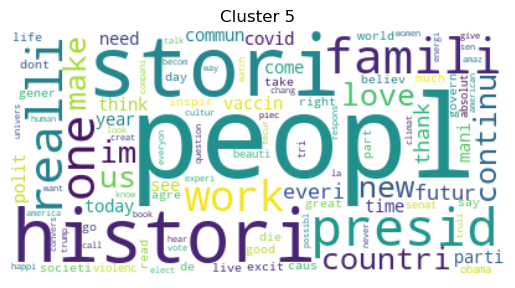

...

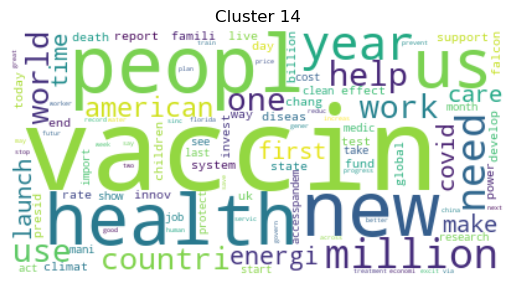

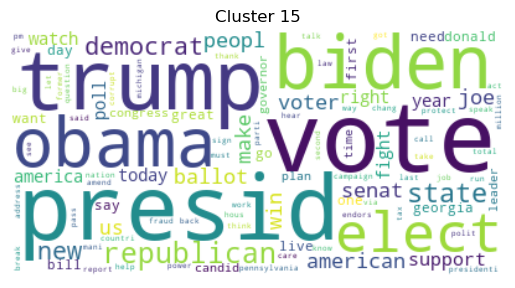

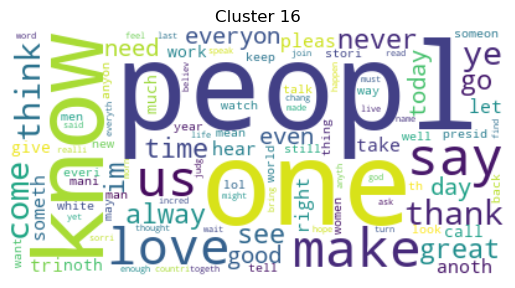

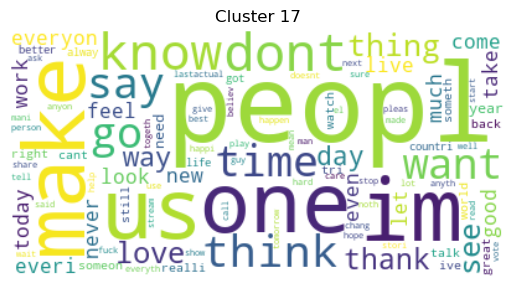

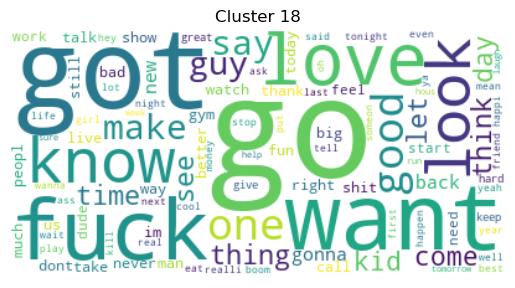

In [144]:
for i in range(k):
    generate_wordcloud(clustered_tweets[i], f'Cluster {i+1}')

In [147]:
from sklearn.feature_extraction.text import TfidfVectorizer

test_df = pd.DataFrame({'preprocessed_tweet': df['full_clean_text'], 'cluster_label': cluster_labels})
grouped = test_df.groupby('cluster_label')['preprocessed_tweet']
preprocessed_clusters = [list(group) for _, group in grouped]

def get_tfidf_scores(cluster):
    vectorizer = TfidfVectorizer()
    tfidf_matrix = vectorizer.fit_transform(cluster)
    scores = zip(vectorizer.get_feature_names(), np.asarray(tfidf_matrix.sum(axis=0)).ravel())
    return sorted(scores, key=lambda x: x[1], reverse=True)

clusters_tfidf = [get_tfidf_scores(cluster) for cluster in preprocessed_clusters]


c:\Users\Tristan\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



In [150]:
def get_top_keywords(tfidf_scores, n=20):
    return [keyword for keyword, score in tfidf_scores[:n]]

top_keywords_per_cluster = [get_top_keywords(tfidf_scores) for tfidf_scores in clusters_tfidf]

for i, keywords in enumerate(top_keywords_per_cluster):
    print(f"Cluster {i + 1}: {', '.join(keywords)}")

Cluster 1: get, like, year, make, one, time, peopl, work, help, day, today, want, world, us, go, new, could, need, look, thank
Cluster 2: world, new, ted, help, talk, women, today, work, year, support, thank, global, live, one, make, great, health, us, book, join
Cluster 3: happi, birthday, love, thank, day, year, much, famili, peopl, new, mani, alway, one, go, time, get, amaz, wish, make, today
Cluster 4: thank, love, much, us, good, great, one, hope, come, see, make, let, day, alway, share, time, work, follow, look, dm
Cluster 5: peopl, stori, realli, histori, presid, famili, one, love, futur, countri, im, us, thank, continu, work, new, make, come, everi, today
Cluster 6: thank, like, one, great, time, new, look, love, need, see, get, today, make, think, watch, first, work, twitter, right, day
Cluster 7: dont, im, know, get, like, think, go, cant, say, someth, want, ive, thing, one, everyon, someon, time, good, peopl, didnt
Cluster 8: peopl, presid, one, us, work, famili, polic, year

In [ ]:
from collections import Counter

def most_frequent_words(cluster, n=20):
    words = " ".join(cluster).split()
    return Counter(words).most_common(n)

top_words_per_cluster = [most_frequent_words(cluster) for cluster in clustered_tweets]

for i, words in enumerate(top_words_per_cluster):
    print(f"Cluster {i + 1}: {', '.join([word for word, count in words])}")

amp http

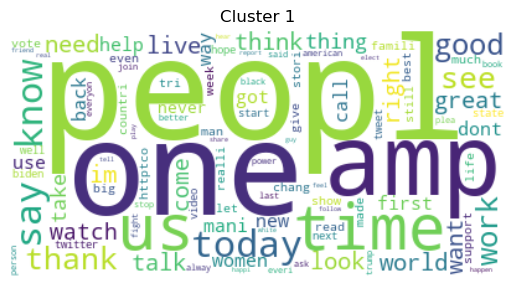

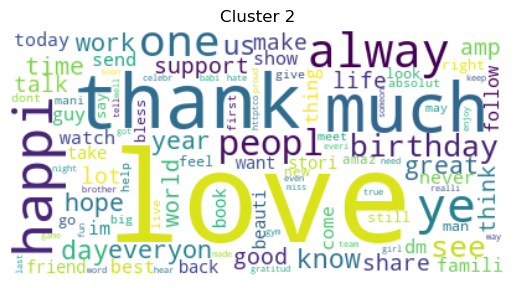

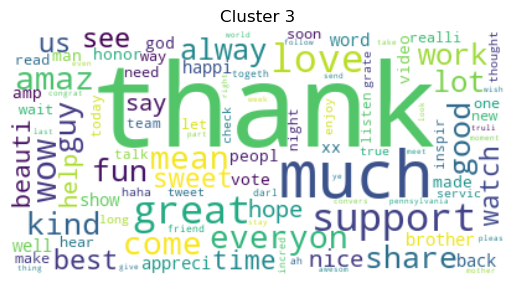

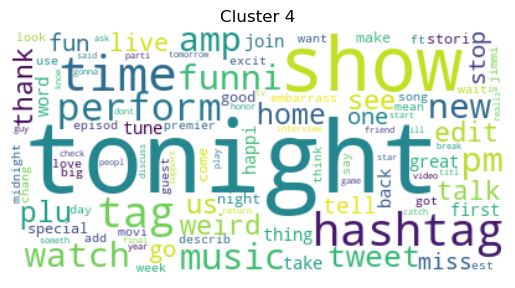

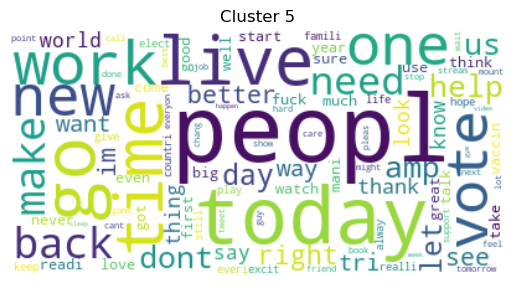

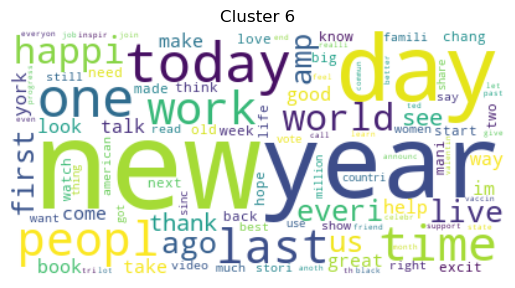

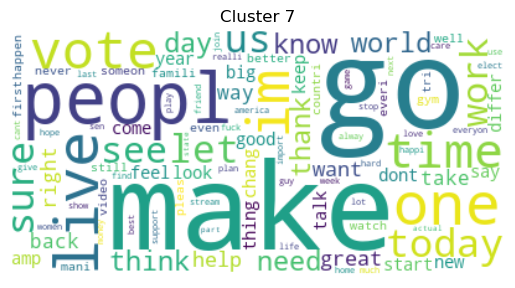

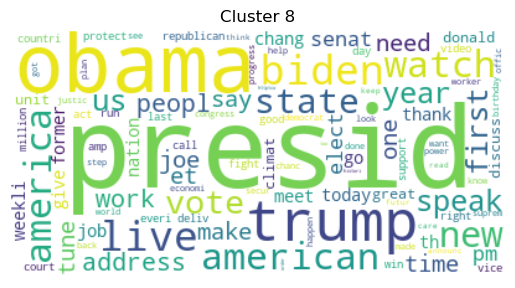

In [65]:
for i in range(k_tfidf):
    generate_wordcloud(clustered_tweets_tfidf[i], f'Cluster {i+1}')

#### DBSCAN Clustering

In [47]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors

In [48]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_bert)

In [49]:
dbscan = DBSCAN(eps=0.6, min_samples=50)
dbscan.fit(X_scaled)

DBSCAN(eps=0.6, min_samples=50)

In [50]:
dbscan_cluster_labels = dbscan.labels_

In [51]:
k = 5 
neigh = NearestNeighbors(n_neighbors=k)
neigh.fit(X_scaled)
distances, _ = neigh.kneighbors(X_scaled)

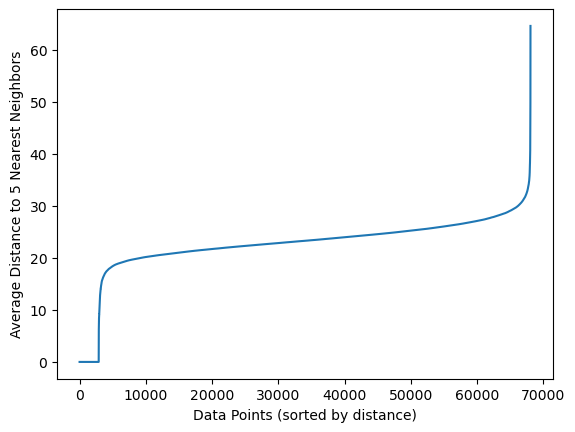

In [52]:
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.xlabel('Data Points (sorted by distance)')
plt.ylabel(f'Average Distance to {k} Nearest Neighbors')
plt.show()

In [53]:
from sklearn.manifold import TSNE

In [141]:
tsne = TSNE(n_components=2, random_state=42, perplexity=8)
X_tsne = tsne.fit_transform(X_bert)

c:\Users\Tristan\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

c:\Users\Tristan\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



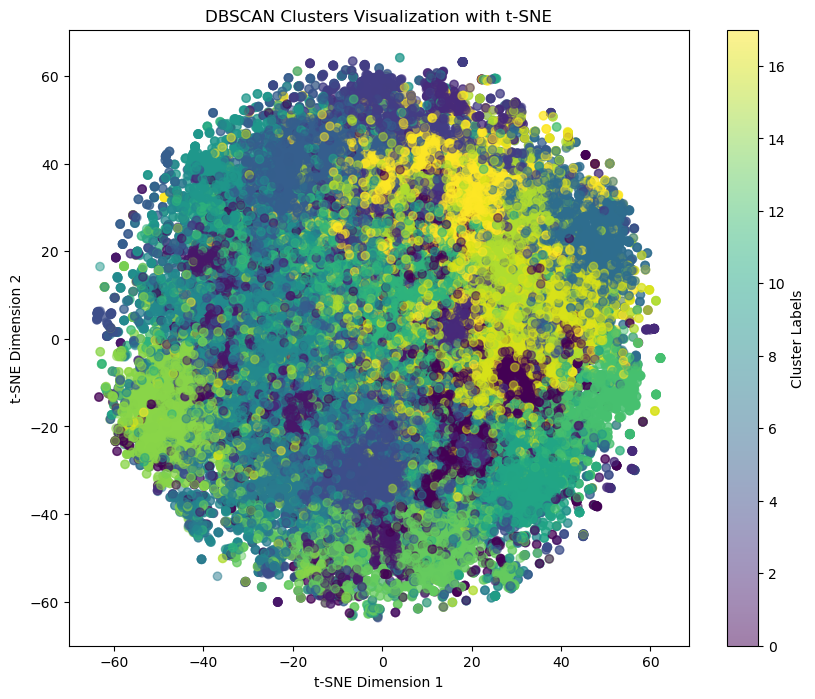

In [142]:
plt.figure(figsize=(10, 8))
scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=cluster_labels, cmap='viridis', alpha=0.5)

# Add a colorbar to display cluster labels
cbar = plt.colorbar(scatter)
cbar.set_label('Cluster Labels')

plt.title('DBSCAN Clusters Visualization with t-SNE')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.show()

In [94]:
import plotly.express as px

In [97]:
cluster_labels

array([1, 0, 0, ..., 0, 0, 3])

In [103]:
X_tsne

array([[ -6.6216583 , -30.683796  ],
       [ 25.800793  ,   9.41506   ],
       [  0.75452435,  -1.6110654 ],
       ...,
       [ 13.917093  ,  25.755686  ],
       [ 13.688834  ,  25.919268  ],
       [-24.278267  ,  17.18736   ]], dtype=float32)

In [119]:
df['full_clean_text']

KeyError: 'full_clean_text'

In [143]:
# Create a DataFrame with t-SNE coordinates, cluster labels, and original tweets
df_viz = pd.DataFrame(X_tsne, columns=["x", "y"])
df_viz["cluster"] = cluster_labels  # Assuming you have a list of cluster labels for each tweet
df_viz["tweet"] = df['full_clean_text']  # Assuming you have a list of original tweets

# Create the interactive plot
fig = px.scatter(df_viz, x="x", y="y", color="cluster", hover_data=["tweet"], color_continuous_scale=px.colors.sequential.Viridis)

# Customize the plot (optional)
fig.update_traces(marker=dict(size=6, opacity=0.8, line=dict(width=1, color="black")))
fig.update_layout(coloraxis_colorbar=dict(title="Cluster"), title="Interactive t-SNE Visualization of Tweets", hoverlabel=dict(bgcolor="white"))

# Show the plot
fig.show()

In [88]:
import hdbscan

In [90]:
# Pre-process the embeddings (optional, but recommended)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_bert)

# Perform clustering with HDBSCAN
min_cluster_size = 10  # Choose the minimum cluster size (you can experiment with different values)
hdb = hdbscan.HDBSCAN(min_cluster_size=min_cluster_size)
hdb.fit(X_scaled)

HDBSCAN(min_cluster_size=10)

In [91]:
# Extract cluster labels
cluster_labels_hdb = hdb.labels_

In [92]:
cluster_labels_hdb

array([-1, -1, -1, ..., -1, -1, -1], dtype=int64)

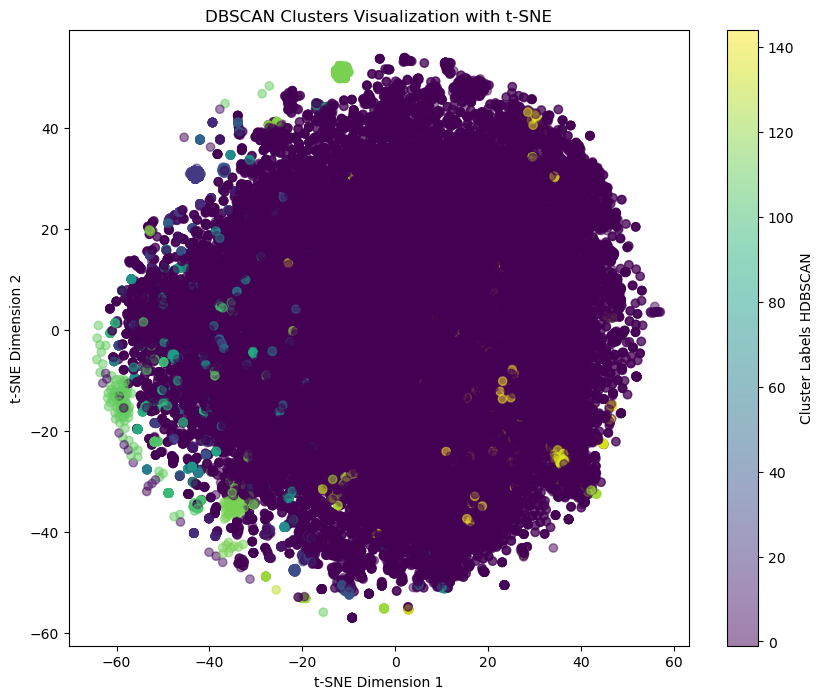

In [93]:
plt.figure(figsize=(10, 8))
scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=cluster_labels_hdb, cmap='viridis', alpha=0.5)

# Add a colorbar to display cluster labels
cbar = plt.colorbar(scatter)
cbar.set_label('Cluster Labels HDBSCAN')

plt.title('DBSCAN Clusters Visualization with t-SNE')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.show()

In [104]:
cluster_counts_hdb = {label: len(tweets) for label, tweets in clustered_tweets.items()}

In [105]:
for label, count in cluster_counts_hdb.items():
    if label == -1:
        print(f"Noise Points: {count} tweets")
    else:
        print(f"Cluster {label}: {count} tweets")


Cluster 0: 5568 tweets
Cluster 1: 5151 tweets
Cluster 2: 2352 tweets
Cluster 3: 11272 tweets


In [ ]:
def get_tfidf_scores(cluster):
    vectorizer = TfidfVectorizer()
    tfidf_matrix = vectorizer.fit_transform(cluster)
    scores = zip(vectorizer.get_feature_names(), np.asarray(tfidf_matrix.sum(axis=0)).ravel())
    return sorted(scores, key=lambda x: x[1], reverse=True)

clusters_tfidf = [get_tfidf_scores(cluster) for cluster in preprocessed_clusters]